In [ ]:
# Sentiment Analysis Working Notebook

In [ ]:
# Master list of all the tickers
ticker_list = ['TSLA', 'ARKK','JNJ','NVDA','XOM']
ticker_sent = {}

In [3]:
# Initial imports
import pandas as pd
from pathlib import Path
import os
from dotenv import load_dotenv
import nltk as nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
get_ipython().run_line_magic("matplotlib", "inline")

import numpy as np
import hvplot.pandas
from numpy.random import seed
seed(1)

%matplotlib inline

from wordcloud import WordCloud
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = [20.0, 10.0]

from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, PorterStemmer
from string import punctuation
import re

import holoviews as hv
from fbprophet import Prophet
import datetime as dt
from numpy import dtype

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

import seaborn
import panel as pn
pn.extension("plotly")
from bokeh.models.widgets import Tabs, Panel
from panel.interact import interact
import ipywidgets as widgets



[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/patriciarajamanickam/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [4]:
def get_ticker_news(ticker):
    data_csv_path = Path("Resources/news/" + ticker + ".csv")
    data_df = pd.read_csv(data_csv_path)
    data_df['Date'] = pd.to_datetime(data_df['Date']).dt.date
    data_df = data_df.groupby('Date')['Title', 'Description'].agg(lambda column: ". ".join(column))
    return data_df
    

In [5]:
def get_ticker_price():
    data_csv_path = Path("Resources/prices/close.csv")
    data_df = pd.read_csv(data_csv_path)
    data_df['Date'] = pd.to_datetime(data_df['Date']).dt.date
    data_df = data_df.set_index('Date')
   
    return data_df

In [6]:
# Sentiment calculation based on compound score
def get_sentiment(score):
    """
    Calculates the sentiment based on the compound score.
    """
    result = 0  # Neutral by default
    if score >= 0.05:  # Positive
        result = 1
    elif score <= -0.05:  # Negative
        result = -1

    return result

In [7]:
def get_sentiment_score(ticker):
    data_df = get_ticker_news(ticker)
    data_df = data_df.reset_index()
    title_sent = {
    "title_compound": [],
    "title_pos": [],
    "title_neu": [],
    "title_neg": [],
    "title_sent": [],
    }
    text_sent = {
    "text_compound": [],
    "text_pos": [],
    "text_neu": [],
    "text_neg": [],
    "text_sent": [],
    }

    # Get sentiment for the text and the title
    for index, row in data_df.iterrows():
        try:
            # Sentiment scoring with VADER
            title_sentiment = analyzer.polarity_scores(row["Title"])
            title_sent["title_compound"].append(title_sentiment["compound"])
            title_sent["title_pos"].append(title_sentiment["pos"])
            title_sent["title_neu"].append(title_sentiment["neu"])
            title_sent["title_neg"].append(title_sentiment["neg"])
            title_sent["title_sent"].append(get_sentiment(title_sentiment["compound"]))

            text_sentiment = analyzer.polarity_scores(row["Description"])
            text_sent["text_compound"].append(text_sentiment["compound"])
            text_sent["text_pos"].append(text_sentiment["pos"])
            text_sent["text_neu"].append(text_sentiment["neu"])
            text_sent["text_neg"].append(text_sentiment["neg"])
            text_sent["text_sent"].append(get_sentiment(text_sentiment["compound"]))
        except AttributeError:
            pass

    # Attaching sentiment columns to the News DataFrame
    title_sentiment_df = pd.DataFrame(title_sent)
    text_sentiment_df = pd.DataFrame(text_sent)
    data_df = data_df.join(title_sentiment_df).join(text_sentiment_df)
    data_df = data_df.set_index('Date')
    return data_df
    
    

In [8]:
def get_clean_df():
    # All the closing prices are in single csv, read that
    data_df_close = get_ticker_price()
    data_df_close.head()

    # Get the sentiment of all the tickers
    for ticker in ticker_list:
       data_df = get_sentiment_score(ticker)
       data_df['Close'] = data_df_close[ticker]
       data_df = data_df[['title_compound', 'text_compound', 'Close']]
       data_df = data_df.dropna()
       ticker_sent[ticker] = data_df
    

In [9]:
def get_data_df_trim(ticker, drop_col):
    data_df = ticker_sent[ticker]
    data_df = data_df.drop(columns=drop_col)
    return data_df

In [10]:
nvda_df = get_ticker_news("NVDA")
nvda_df.head()

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


,Title,Description
Date,,
2022-01-02,Top 10 Growth Investing Stocks For 2022. Bitco...,Our preference towards growth investing is to ...
2022-01-03,Downgrading Intel. 3 Surefire Metaverse Stocks...,"After about two quarters into his dream job, C..."
2022-01-04,"Tesla, Apple and This Chipmaker Are Seeing The...",Electric vehicle maker Tesla Inc. (NASDAQ: TSL...
2022-01-05,"Nvidia's Bull Run May Continue, But Micron Is ...",Nvidia (NVDA) and Micron (MU) are 2 semiconduc...
2022-01-06,Nvidia DRIVE Orin Chip To Power Baidu's JiDU R...,U.S. listed Chinese internet giant Baidu Inc (...


In [11]:
# Instantiate the lemmatizer
lemmatizer = WordNetLemmatizer()

# Create a list of stopwords
sw = set(stopwords.words('english'))

# Expand the default stopwords list if necessary
sw_addons = {'say','though','some','wouldn\'t', 'take','all','also','found','still','said','may','since'}

In [12]:
def tokenizer(text,func_overide_param):
    """
    Tokenizes the text
    Second parameter is function overide param utilized to get list of tokens from the text 
    or 
    obtain big string of tokens separated by spaces.
    """
    
    # Remove the punctuation from text
    regex = re.compile("[^a-zA-Z ]")
    re_clean = regex.sub('', text)

    # Create a tokenized list of the words
    words = word_tokenize(re_clean)
    
    
    # Lemmatize words into root words
    lem = [lemmatizer.lemmatize(word) for word in words]
   
    # Convert the words to lowercase
    # Remove the stop words
    tokens = [word.lower() for word in lem if word.lower() not in sw.union(sw_addons)]
    if func_overide_param == 'A':
        return tokens
    else:
        return ' '.join(tokens)
    

In [13]:
def ticker_news_string_tokens(ticker,over_ride):
    df = get_ticker_news(ticker)
    title_string = ' '.join(df['Title'])
    title_tokens_string = tokenizer(title_string,over_ride)
    return title_tokens_string
    
def ticker_wordcloud(ticker):
    title_tokens_string = ticker_news_string_tokens(ticker,'B')
    title_wc = WordCloud().generate(title_tokens_string)
    return plt.imshow(title_wc)

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


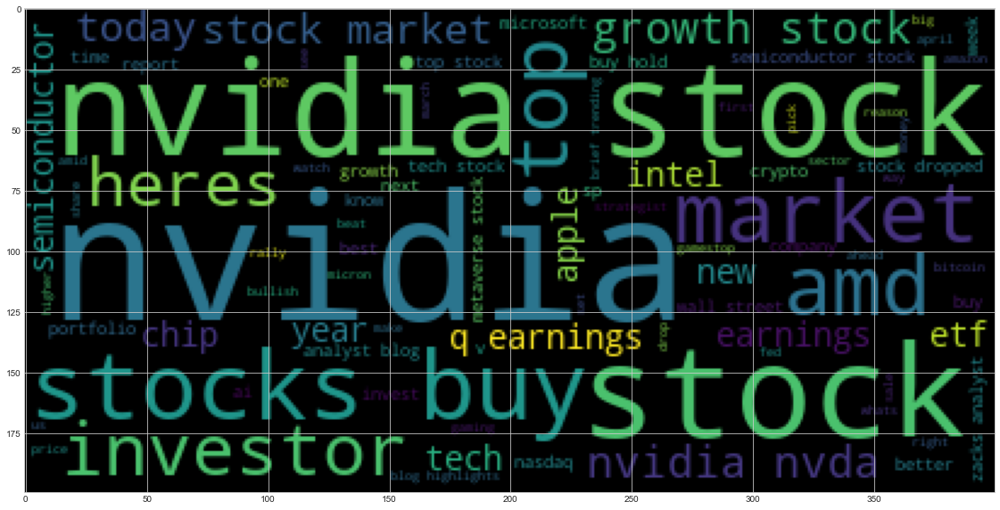

In [14]:
nvda_wc = ticker_wordcloud("NVDA")
plt.savefig(Path("Images/NVDA_Title_WordCloud.png"))

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


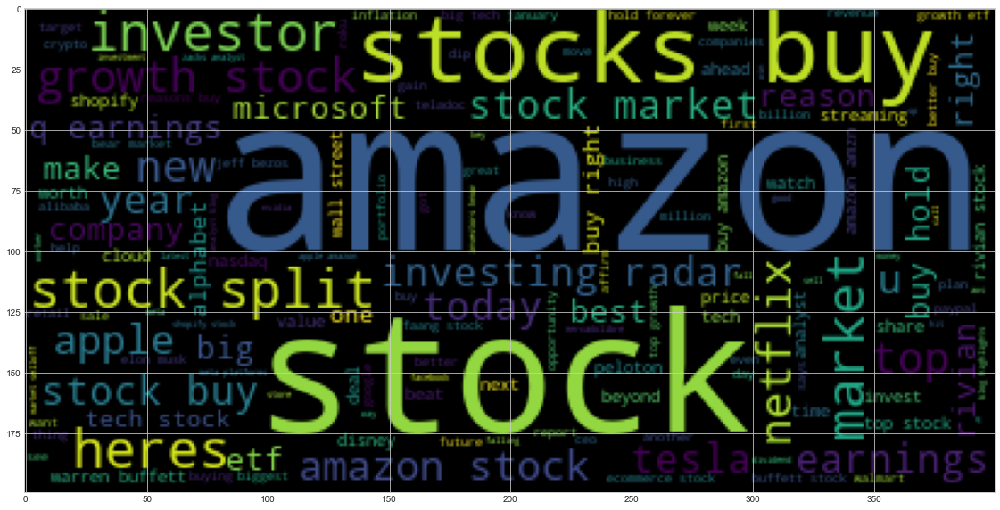

In [15]:
amzn_wc = ticker_wordcloud("AMZN")
plt.savefig(Path("Images/AMZN_Title_WordCloud.png"))

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


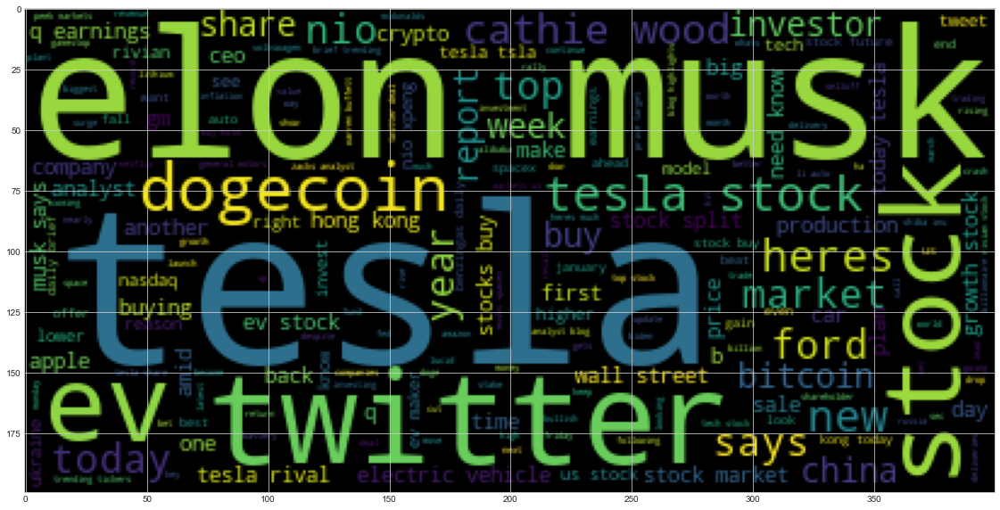

In [16]:
tsla_wc = ticker_wordcloud("TSLA")
plt.savefig(Path("Images/TSLA_Title_WordCloud.png"))

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


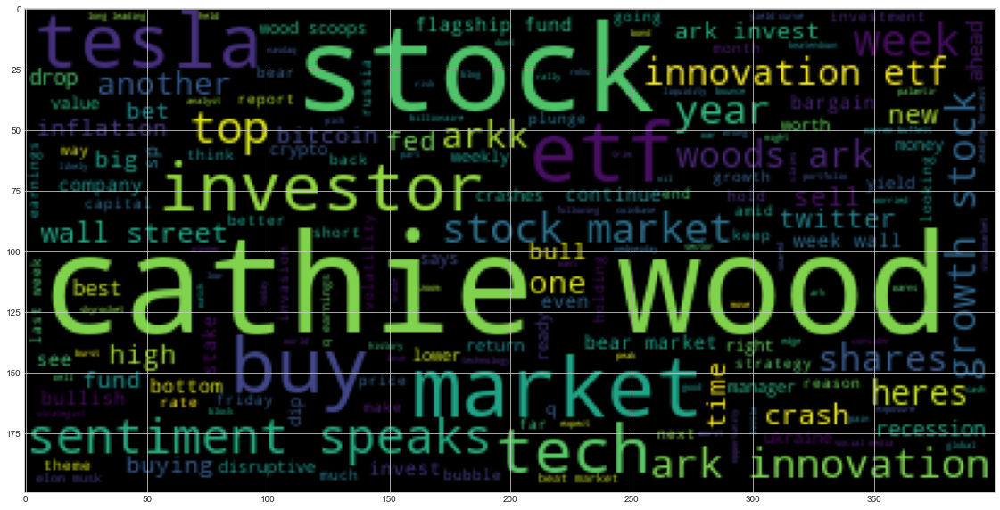

In [17]:
arkk_wc = ticker_wordcloud("ARKK")
plt.savefig(Path("Images/ARKK_Title_WordCloud.png"))

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


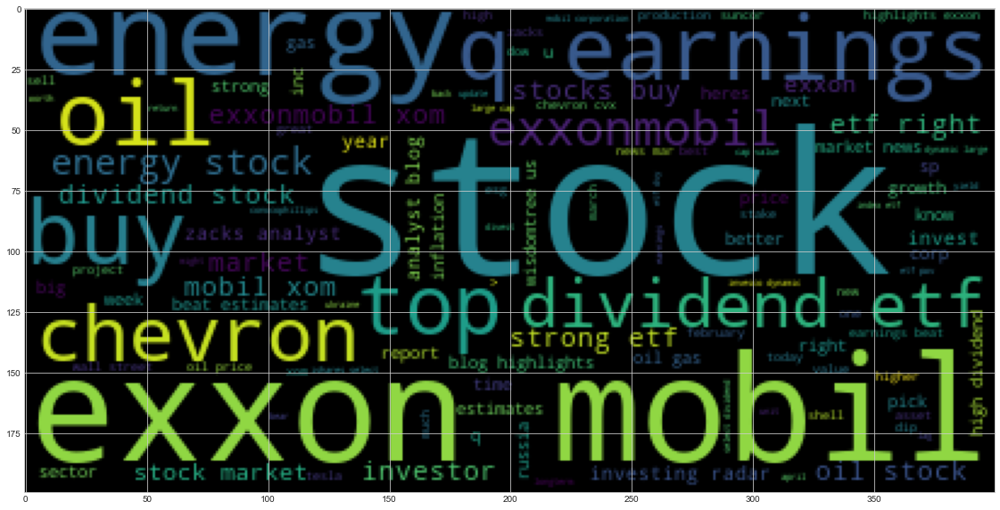

In [18]:
xom_wc = ticker_wordcloud("XOM")
plt.savefig(Path("Images/XOM_Title_WordCloud.png"))

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


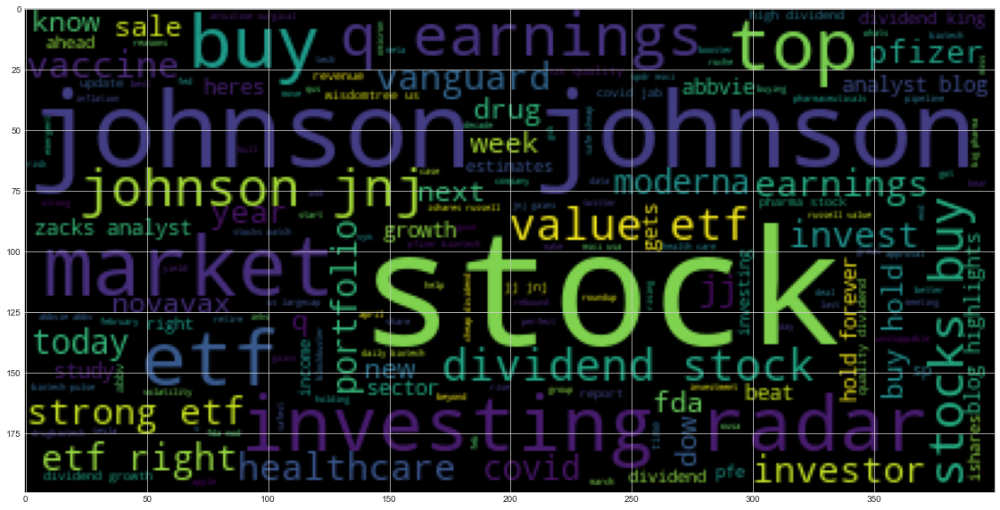

In [19]:
jnj_wc = ticker_wordcloud("JNJ")
plt.savefig(Path("Images/JNJ_Title_WordCloud.png"))

In [20]:
nvda_sentiscore_df = get_sentiment_score("NVDA")
nvda_sentiscore_df

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


,Title,Description,title_compound,title_pos,title_neu,title_neg,title_sent,text_compound,text_pos,text_neu,text_neg,text_sent
Date,,,,,,,,,,,,
2022-01-02,Top 10 Growth Investing Stocks For 2022. Bitco...,Our preference towards growth investing is to ...,0.7841,0.217,0.783,0.000,1,0.9622,0.070,0.923,0.006,1
2022-01-03,Downgrading Intel. 3 Surefire Metaverse Stocks...,"After about two quarters into his dream job, C...",0.9393,0.156,0.844,0.000,1,0.9928,0.106,0.871,0.023,1
2022-01-04,"Tesla, Apple and This Chipmaker Are Seeing The...",Electric vehicle maker Tesla Inc. (NASDAQ: TSL...,0.6174,0.044,0.937,0.019,1,0.9922,0.107,0.878,0.016,1
2022-01-05,"Nvidia's Bull Run May Continue, But Micron Is ...",Nvidia (NVDA) and Micron (MU) are 2 semiconduc...,0.8970,0.084,0.881,0.035,1,0.9979,0.112,0.852,0.036,1
2022-01-06,Nvidia DRIVE Orin Chip To Power Baidu's JiDU R...,U.S. listed Chinese internet giant Baidu Inc (...,0.7003,0.072,0.928,0.000,1,0.9304,0.059,0.906,0.034,1
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-27,Cathie Wood's Ark Invest Makes Nvidia Re-Entry...,Popular stock picker Cathie Wood’s Ark Invest ...,0.5519,0.104,0.822,0.074,1,0.9718,0.096,0.864,0.040,1
2022-05-28,No tech sector appears safe from the spring sw...,"Nvidia, Nutanix, and Snowflake are the latest ...",0.1779,0.126,0.779,0.095,1,0.5423,0.083,0.869,0.048,1
2022-05-29,The 2 Smartest Tech Stocks to Buy in 2022 and ...,These companies could give investors' portfoli...,0.6124,0.308,0.692,0.000,1,0.6705,0.355,0.645,0.000,1


In [21]:
nvda_sentiscore_df.hvplot(
    y=["title_sent", "text_sent"],
    kind="scatter",
    title="NVDA News Title and Text Sentiment Comparison",
    width=1100,
    grid=True,
    legend='top_left'
)


:NdOverlay   [Variable]
   :Scatter   [Date]   (value)

In [22]:
tsla_sentiscore_df = get_sentiment_score("TSLA")

tsla_sentiscore_df.hvplot(
    y=["title_sent", "text_sent"],
    kind="scatter",
    title="TSLA News Title and Text Sentiment Comparison",
    width=1100,
    grid=True,
    legend='top_left'
)


/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


:NdOverlay   [Variable]
   :Scatter   [Date]   (value)

In [23]:
arkk_sentiscore_df = get_sentiment_score("ARKK")

arkk_sentiscore_df.hvplot(
    y=["title_sent", "text_sent"],
    kind="scatter",
    title="ARKK News Title and Text Sentiment Comparison",
    width=1100,
    grid=True,
    legend='top_left'
)

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


:NdOverlay   [Variable]
   :Scatter   [Date]   (value)

In [24]:
xom_sentiscore_df = get_sentiment_score("XOM")

xom_sentiscore_df.hvplot(
    y=["title_sent", "text_sent"],
    kind="scatter",
    title="XOM News Title and Text Sentiment Comparison",
    width=1100,
    grid=True,
    legend='top_left'
)

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


:NdOverlay   [Variable]
   :Scatter   [Date]   (value)

In [25]:
jnj_sentiscore_df = get_sentiment_score("JNJ")

jnj_sentiscore_df.hvplot(
    y=["title_sent", "text_sent"],
    kind="scatter",
    title="XOM News Title and Text Sentiment Comparison",
    width=1100,
    grid=True,
    legend='top_left'
)

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


:NdOverlay   [Variable]
   :Scatter   [Date]   (value)

In [26]:
amzn_sentiscore_df = get_sentiment_score("AMZN")

amzn_sentiscore_df.hvplot(
    y=["title_sent", "text_sent"],
    kind="scatter",
    title="AMZN News Title and Text Sentiment Comparison",
    width=1100,
    grid=True,
    legend='top_left'
)

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


:NdOverlay   [Variable]
   :Scatter   [Date]   (value)

In [27]:
def bossy_news_wordcloud(ticker):
    news_desc_strings = ticker_news_string_tokens(ticker,"A")
    # Calculating TF-IDF for the working corpus.
    vectorizer = TfidfVectorizer(stop_words="english")
    X = vectorizer.fit_transform(news_desc_strings)
    news_df = pd.DataFrame(
    list(zip(vectorizer.get_feature_names(), np.ravel(X.sum(axis=0)))),
    columns=["Word", "Frequency"],
    )
    news_df = news_df.sort_values(by=["Frequency"], ascending=False)
    top_words = news_df[
    (news_df["Frequency"] >= 30) & (news_df["Frequency"] <= 1000)
    ]
    terms_list = str(top_words["Word"].tolist())
    wordcloud = WordCloud(colormap="RdYlBu").generate(terms_list)
    plt.imshow(wordcloud)
    plt.axis("off")
    fontdict = {"fontsize": 20, "fontweight": "bold"}
    
    return plt

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


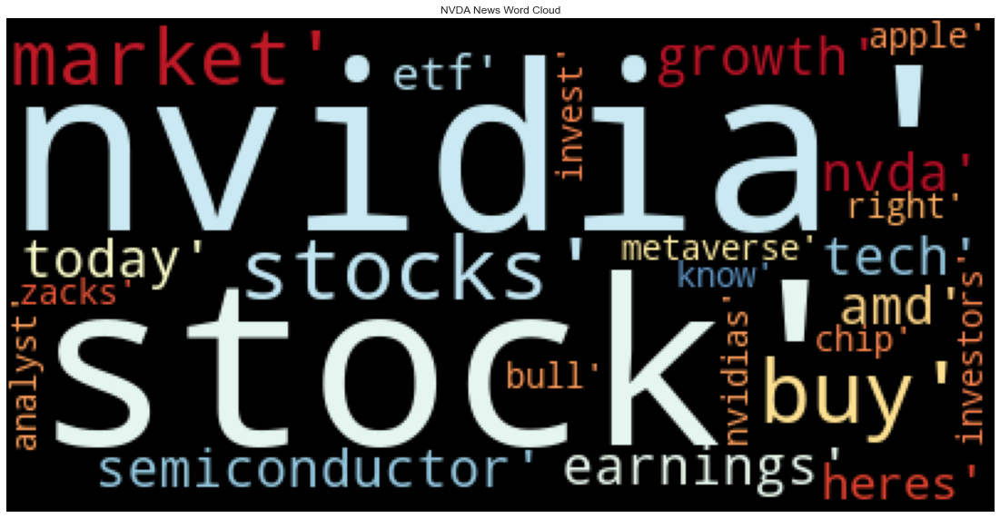

In [54]:
nvda_plt = bossy_news_wordcloud("NVDA")
nvda_plt.title("NVDA News Word Cloud")
nvda_plt.savefig(Path("Images/NVDA_Popular_Words.png"))
nvda_plt.show()

<Figure size 1440x720 with 0 Axes>

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


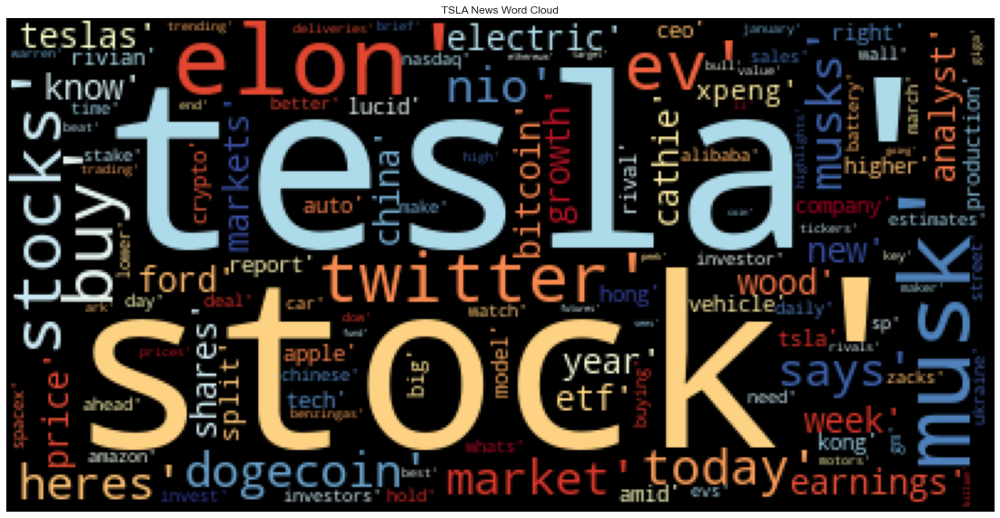

In [55]:
tsla_plt = bossy_news_wordcloud("TSLA")
tsla_plt.title("TSLA News Word Cloud")
tsla_plt.savefig(Path("Images/TSLA_Popular_Words.png"))
tsla_plt.show()


/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


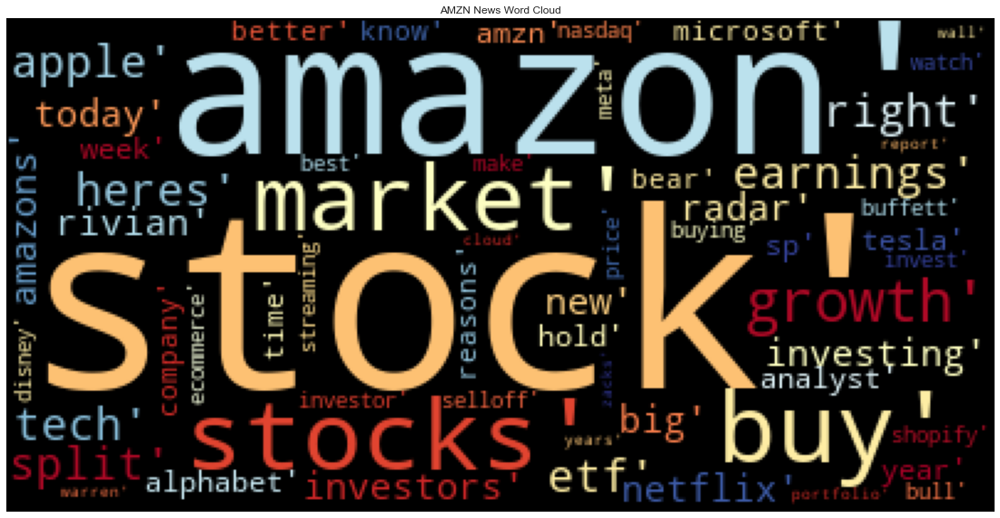

In [56]:
amzn_plt = bossy_news_wordcloud("AMZN")
amzn_plt.title("AMZN News Word Cloud")
amzn_plt.savefig(Path("Images/AMZN_Popular_Words.png"))
amzn_plt.show()


/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


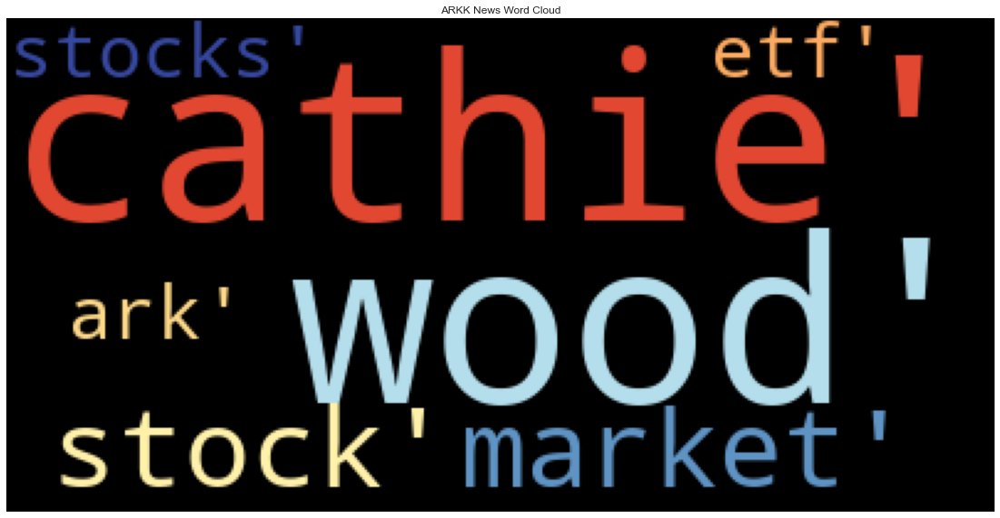

In [57]:
arkk_plt = bossy_news_wordcloud("ARKK")
arkk_plt.title("ARKK News Word Cloud")
arkk_plt.savefig(Path("Images/ARKK_Popular_Words.png"))
arkk_plt.show()


/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


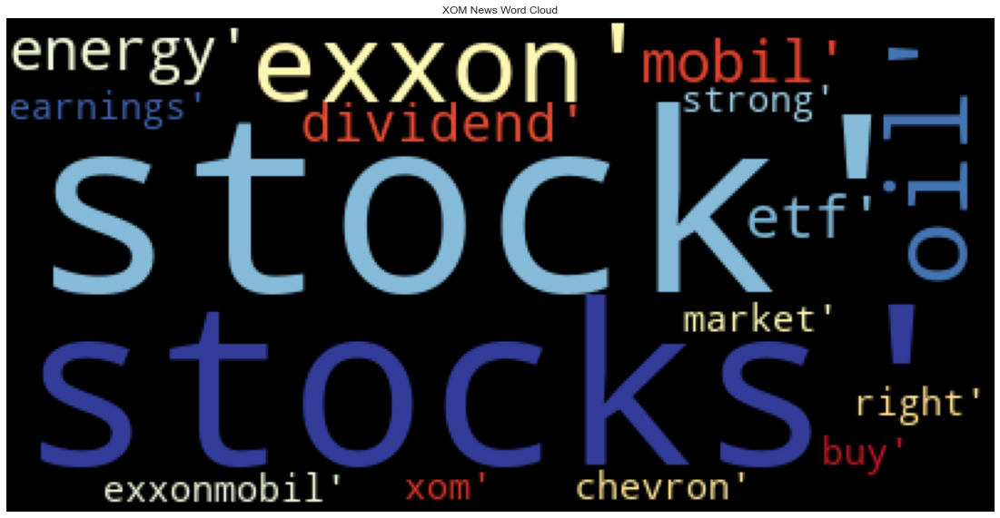

In [58]:
xom_plt = bossy_news_wordcloud("XOM")
xom_plt.title("XOM News Word Cloud")
xom_plt.savefig(Path("Images/XOM_Popular_Words.png"))
xom_plt.show()


/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


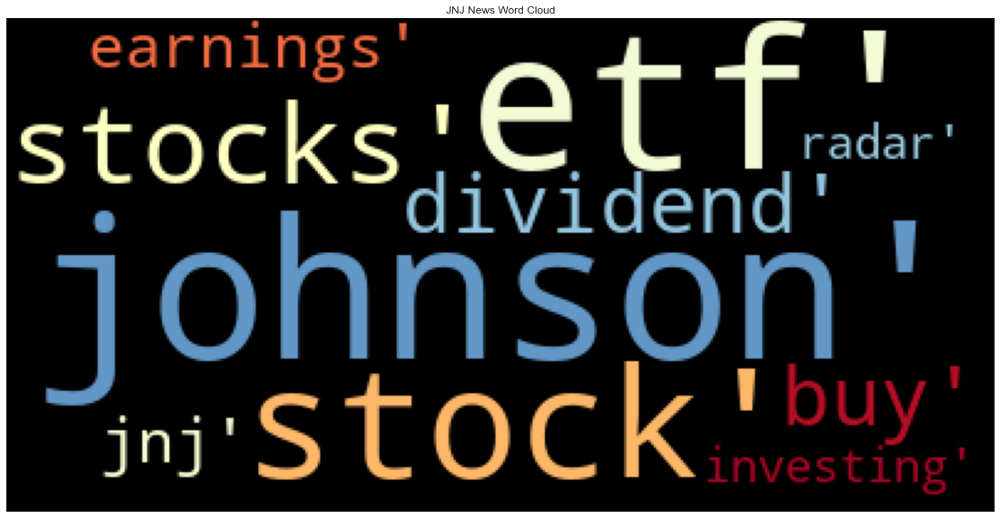

In [59]:
jnj_plt = bossy_news_wordcloud("JNJ")
jnj_plt.title("JNJ News Word Cloud")
jnj_plt.savefig(Path("Images/JNJ_Popular_Words.png"))
jnj_plt.show()


In [34]:
def get_correlation(ticker):
    get_clean_df()
    ticker_df = ticker_sent[ticker]
    ticker_df['Close'] = ticker_df['Close'].pct_change().dropna()
    ticker_df = ticker_df.dropna()
    correlation = ticker_df.corr().style.background_gradient()
    return correlation

In [35]:
nvda_corr = get_correlation('NVDA')
nvda_corr

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


,title_compound,text_compound,Close
title_compound,1.000000,0.101582,0.027865
text_compound,0.101582,1.000000,0.108715
Close,0.027865,0.108715,1.000000


In [36]:
get_correlation('TSLA')

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


,title_compound,text_compound,Close
title_compound,1.000000,0.065797,-0.046733
text_compound,0.065797,1.000000,0.112540
Close,-0.046733,0.112540,1.000000


In [37]:
get_correlation('ARKK')

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


,title_compound,text_compound,Close
title_compound,1.000000,0.306645,-0.139264
text_compound,0.306645,1.000000,-0.138703
Close,-0.139264,-0.138703,1.000000


In [38]:
get_correlation('XOM')

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


,title_compound,text_compound,Close
title_compound,1.000000,0.557426,-0.133112
text_compound,0.557426,1.000000,0.085867
Close,-0.133112,0.085867,1.000000


In [43]:
ticker_list1 = ['NVDA','AMZN','TSLA','XOM','ARKK','JNJ']
select = pn.widgets.Select(name="Select", options=ticker_list1)
def create_plot(symbol):
    df = get_sentiment_score(symbol)
    plot = df.hvplot(y=["title_sent", "text_sent"],
              kind="scatter",
              title="News Title and Text Sentiment Comparison",
              width=1100,
              grid=True,
              legend='top_left'
             )
    return plot
    
interact(create_plot,symbol=select)

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


Column
    [0] Column
        [0] Select(options=['NVDA', 'AMZN', ...], value='NVDA')
    [1] Row
        [0] HoloViews(NdOverlay, name='interactive09635')

In [40]:
select = pn.widgets.Select(name="Select", options=ticker_list)
def create_corr(symbol):
    correleation = get_correlation(symbol)
    return correleation
    
interact(create_corr,symbol=select)

/usr/local/anaconda3/envs/algotradingdl/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """


Column
    [0] Column
        [0] Select(options=['TSLA', 'ARKK', ...], value='TSLA')
    [1] Row
        [0] DataFrame(Styler, name='interactive05108')

In [41]:
select = widgets.Dropdown(description="Select", options=ticker_list1)
def create_wordcloud(symbol):
    ticker_wordcloud(symbol)

widgets.interact(create_wordcloud,symbol=select)

interactive(children=(Dropdown(description='Select', options=('AMZN', 'TSLA', 'XOM', 'ARKK', 'JNJ'), value='AM…

<function __main__.create_wordcloud(symbol)>

In [42]:
select = widgets.Dropdown(description="Select", options=ticker_list1)

def create_bossy_wordcloud(symbol):
    bossy_news_wordcloud(symbol)

widgets.interact(create_bossy_wordcloud,symbol=select)

interactive(children=(Dropdown(description='Select', options=('AMZN', 'TSLA', 'XOM', 'ARKK', 'JNJ'), value='AM…

<function __main__.create_bossy_wordcloud(symbol)>